In [3]:
import numpy as np
import pandas as pd
import feather
from pathlib import Path
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [5]:
rootdir = Path().resolve().parent
datadir = rootdir / "data/cache/df"

In [6]:
df = feather.read_dataframe(datadir / "ppo_df_1min.feather")

In [18]:
features = [c for c in df.columns if c.startswith("ROC_")]
labels = []
for minute in [1, 5, 10]:
    df[f"return{minute}min"] = df["close"].shift(-minute) / df["close"] - 1
    labels.append(f"return{minute}min")
    
dfl = df.dropna().reset_index(drop=True)

In [21]:
import sklearn.linear_model as linear_model
from sklearn.model_selection import TimeSeriesSplit

tscv = TimeSeriesSplit(n_splits=5)

In [20]:
X = dfl[features].values
Y = dfl[labels].values

In [59]:
for train_index, test_index in tscv.split(X):
    reg = linear_model.BayesianRidge()
    train_X, train_y = X[train_index, :], Y[train_index, 2]
    test_X, test_y = X[test_index, :], Y[test_index, 2]
    reg.fit(train_X, train_y)
    break

In [60]:
train_ypred = reg.predict(train_X)
test_ypred = reg.predict(test_X)

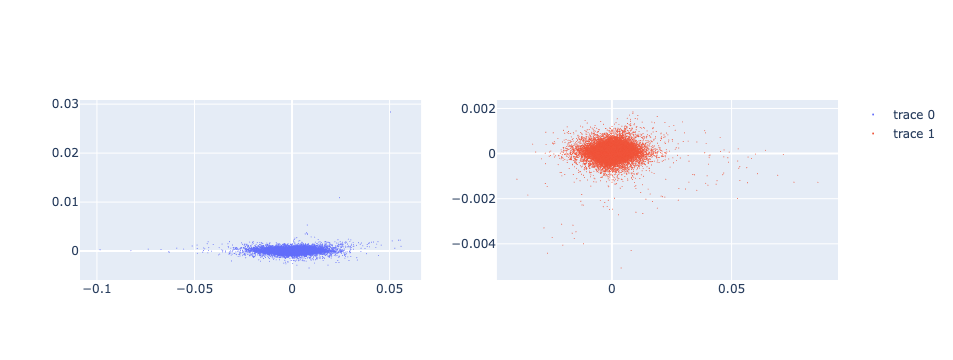

In [61]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(go.Scatter(
    x=train_y,
    y=train_ypred,
    mode="markers",
    marker=dict(
        size=1
    )
), row=1, col=1)

fig.add_trace(go.Scatter(
    x=test_y,
    y=test_ypred,
    mode="markers",
    marker=dict(
        size=1
    )
), row=1, col=2)

In [62]:
reg.score(train_X, train_y), reg.score(test_X, test_y)

(0.004600858568337585, 0.000596519788347627)

In [63]:
ts, p = dfl.loc[train_index][["timestamp", "close"]].values.T

In [64]:
ppred = p * (train_ypred + 1)

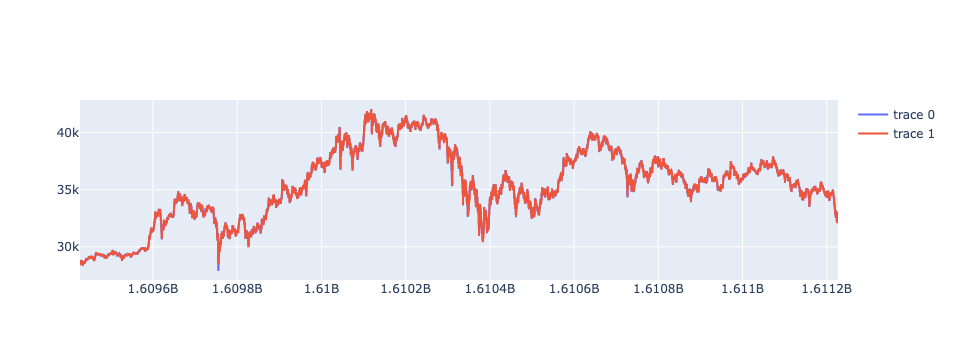

In [66]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=ts, y=p
))

# fig.add_trace(go.Scatter(
#     x=ts[15:], y=ppred[:-15]
# ))
fig.add_trace(go.Scatter(
    x=ts, y=ppred
))